In [ ]:
%tensorflow_version 1.x
!pip install numpy==1.18
!pip install mock
!pip install tensorflow-gan
!pip install tensorflow-datasets==3.2.1 

%cd /content
! rm -rf gan-tools
! rm -rf stylegan-lowshot
!git clone --single-branch --depth=1 --branch master https://github.com/hannesdm/gan-tools.git
!git clone --single-branch --depth=1 --branch main https://github.com/hannesdm/stylegan-lowshot.git
%cd gan-tools
from keras.datasets import mnist
import impl
from impl import *
from core import vis
from core import gan
from core import constraint
import matplotlib.pyplot as plt
plt.rcParams['image.cmap'] = 'gray'
plt.rcParams['axes.grid'] = False


TensorFlow 1.x selected.
     |████████████████████████████████| 20.1 MB 1.3 MB/s 
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully uninstalled numpy-1.21.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lucid 0.3.10 requires umap-learn, which is not installed.
tensorflow 1.15.2 requires gast==0.2.2, but you have gast 0.5.3 which is incompatible.
tables 3.7.0 requires numpy>=1.19.0, but you have numpy 1.18.0 which is incompatible.
kapre 0.3.7 requires numpy>=1.18.5, but you have numpy 1.18.0 which is incompatible.
kapre 0.3.7 requires tensorflow>=2.0.0, but you have tensorflow 1.15.2 which is incompatible.
jaxlib 0.3.7+cuda11.cudnn805 requires numpy>=1.19, but you have numpy 1.18.0 which is incompatible.
jax 0.3.8 requires numpy>=1.19, but you have numpy 1.18.0 which is incompatible.


     |████████████████████████████████| 3.4 MB 4.9 MB/s 
  Attempting uninstall: tensorflow-datasets
    Found existing installation: tensorflow-datasets 4.0.1
    Uninstalling tensorflow-datasets-4.0.1:
      Successfully uninstalled tensorflow-datasets-4.0.1
/content
Cloning into 'gan-tools'...
remote: Enumerating objects: 20, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 20 (delta 3), reused 15 (delta 1), pack-reused 0
Unpacking objects: 100% (20/20), done.
Cloning into 'stylegan-lowshot'...
remote: Enumerating objects: 41, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 41 (delta 4), reused 38 (delta 4), pack-reused 0
Unpacking objects: 100% (41/41), done.
/content/gan-tools


Using TensorFlow backend.


## Load the cifar10 data
The CIFAR-10 dataset consists of 60000 32x32 colour images in 10 classes, with 6000 images per class. There are 50000 training images and 10000 test images.  <br/>
**Exercise** We will select a single class of this dataset to model. This can be done by setting the **model_class** variable to the corresponding class. <br/>
One cell lower, a few images of the selected class are shown.

In [ ]:
model_class = 0
(X_train_original, Y_train), (_, _) = cifar10.load_data()
X_train_single_class = X_train_original[np.where(np.squeeze(Y_train) == model_class)]
X_train = X_train_single_class / 127.5 - 1.

170500096/170498071 [==============================] - 4s 0us/step


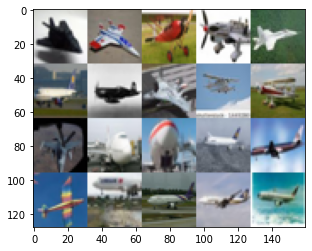

In [7]:
grid = vis.image_grid(X_train_single_class[0:20], 5)
plt.imshow(grid)

## Train the DCGAN
<img src="https://i.imgur.com/NFUiEf5.png" width="450"> <br/>
The following code will train a GAN with a working DCGAN architecture. This training can be controlled by the following parameters:


*   **batches**: The number of batches the GAN should train on.
*   **batch_size**: The size of each batch.
*    **plot_interval**: After how many batches the generator should be sampled and the images shown.

The default parameters may be kept. <br/>
Make sure to train the GAN for a sufficient amount of time in order to see realistic samples. At any point, the training may be stopped by clicking on the stop button or on 'interrupt execution' in the runtime menu at the top of the page.<br/> In the same menu, the runtime type should also be changed to 'GPU'. This will speed up the training of the models. <br/>
**Exercise** Comment on the loss and accuracy of the generator and discriminator, shown during training and discuss its stability. Explain this in function of the GAN setting.





  0%|          | 0/7000 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
Batch 1,   D loss: 1.0964 D acc: 0.4219 G loss: 1.023 G acc: 0.375:   0%|          | 0/7000 [00:09<?, ?it/s]

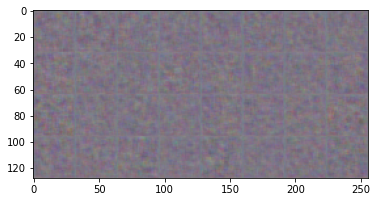

Batch 1,   D loss: 1.0964 D acc: 0.4219 G loss: 1.023 G acc: 0.375:   0%|          | 1/7000 [00:10<19:43:18, 10.14s/it]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
Batch 101,   D loss: 0.5276 D acc: 0.7188 G loss: 1.4689 G acc: 0.1562:   1%|▏         | 100/7000 [00:21<12:56,  8.89it/s]

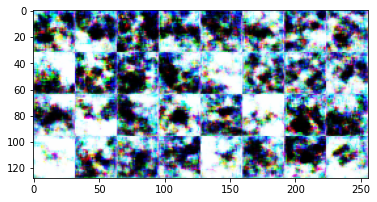

Batch 201,   D loss: 0.3631 D acc: 0.875 G loss: 1.7865 G acc: 0.0938:   3%|▎         | 200/7000 [00:33<12:50,  8.82it/s]

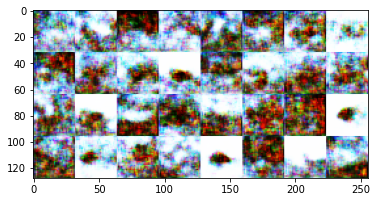

Batch 301,   D loss: 0.5219 D acc: 0.7344 G loss: 1.9246 G acc: 0.1406:   4%|▍         | 300/7000 [00:46<13:10,  8.47it/s]

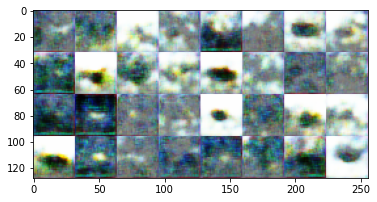

Batch 401,   D loss: 0.4449 D acc: 0.7969 G loss: 1.1621 G acc: 0.3906:   6%|▌         | 400/7000 [00:59<14:49,  7.42it/s]

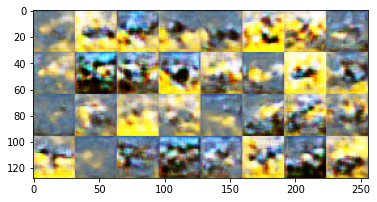

Batch 501,   D loss: 1.1368 D acc: 0.3438 G loss: 1.0478 G acc: 0.3281:   7%|▋         | 500/7000 [01:11<14:16,  7.59it/s]

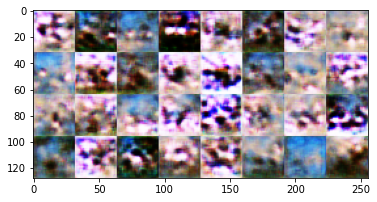

Batch 601,   D loss: 0.3276 D acc: 0.8594 G loss: 1.826 G acc: 0.1094:   9%|▊         | 600/7000 [01:24<13:06,  8.13it/s] 

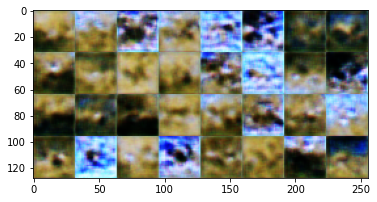

Batch 701,   D loss: 0.6271 D acc: 0.6875 G loss: 0.9687 G acc: 0.4688:  10%|█         | 700/7000 [01:37<12:16,  8.55it/s]

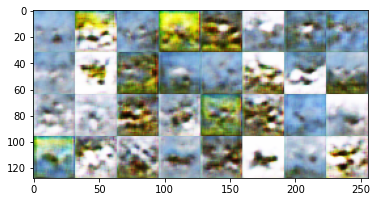

Batch 801,   D loss: 0.8535 D acc: 0.5 G loss: 0.9825 G acc: 0.3438:  11%|█▏        | 800/7000 [01:51<14:19,  7.21it/s]

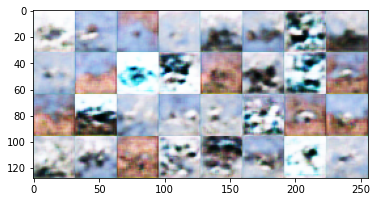

Batch 901,   D loss: 0.4417 D acc: 0.7969 G loss: 1.7964 G acc: 0.0469:  13%|█▎        | 900/7000 [02:04<13:50,  7.34it/s]

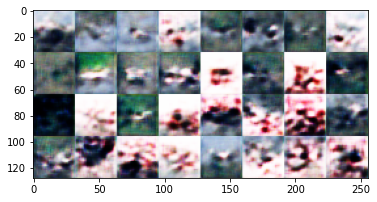

Batch 1001,   D loss: 0.6072 D acc: 0.7188 G loss: 1.2099 G acc: 0.3281:  14%|█▍        | 1000/7000 [02:17<13:04,  7.65it/s]

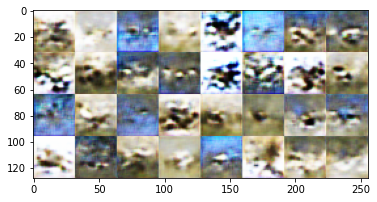

Batch 1101,   D loss: 0.8393 D acc: 0.5469 G loss: 1.058 G acc: 0.3125:  16%|█▌        | 1100/7000 [02:30<11:48,  8.33it/s] 

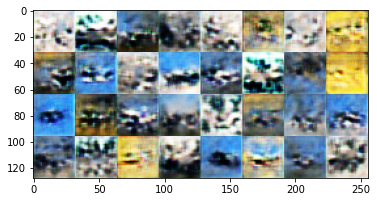

Batch 1201,   D loss: 0.734 D acc: 0.5312 G loss: 1.0607 G acc: 0.375:  17%|█▋        | 1200/7000 [02:44<11:52,  8.14it/s] 

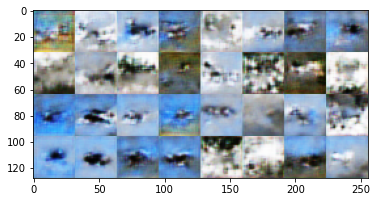

Batch 1301,   D loss: 0.8191 D acc: 0.4688 G loss: 0.8032 G acc: 0.4844:  19%|█▊        | 1300/7000 [02:57<12:33,  7.56it/s]

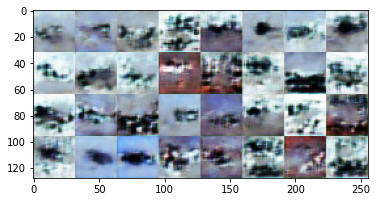

Batch 1401,   D loss: 0.6489 D acc: 0.7344 G loss: 1.0141 G acc: 0.2969:  20%|██        | 1400/7000 [03:11<12:23,  7.53it/s]

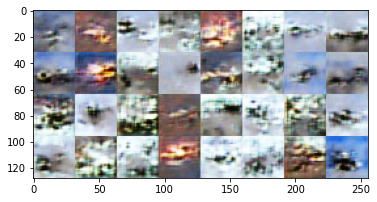

Batch 1501,   D loss: 0.9147 D acc: 0.4219 G loss: 1.0208 G acc: 0.3281:  21%|██▏       | 1500/7000 [03:24<10:56,  8.37it/s]

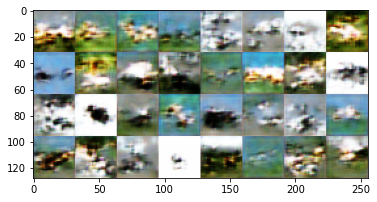

Batch 1601,   D loss: 0.4237 D acc: 0.8438 G loss: 1.0716 G acc: 0.2969:  23%|██▎       | 1600/7000 [03:37<11:35,  7.77it/s]

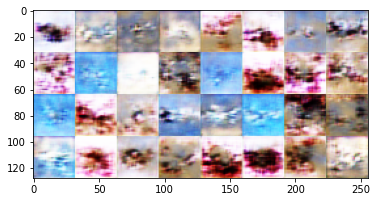

Batch 1701,   D loss: 0.7301 D acc: 0.5469 G loss: 1.005 G acc: 0.2812:  24%|██▍       | 1700/7000 [03:51<11:15,  7.84it/s] 

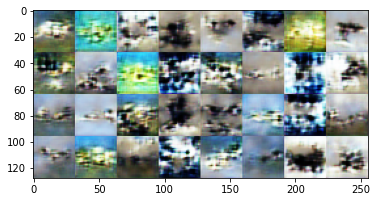

Batch 1801,   D loss: 0.6352 D acc: 0.6406 G loss: 0.8132 G acc: 0.5312:  26%|██▌       | 1800/7000 [04:04<10:57,  7.90it/s]

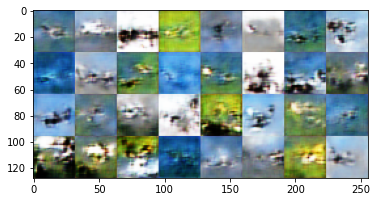

Batch 1901,   D loss: 0.6405 D acc: 0.6406 G loss: 1.0335 G acc: 0.2656:  27%|██▋       | 1900/7000 [04:17<11:19,  7.50it/s]

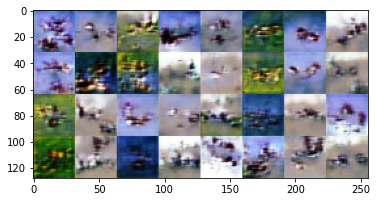

Batch 2001,   D loss: 0.6616 D acc: 0.5938 G loss: 0.9023 G acc: 0.3594:  29%|██▊       | 2000/7000 [04:30<11:43,  7.10it/s]

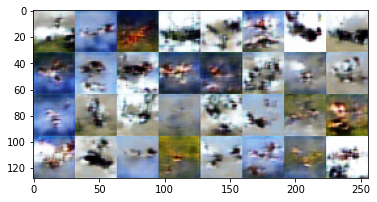

Batch 2101,   D loss: 0.7462 D acc: 0.5625 G loss: 1.0307 G acc: 0.2344:  30%|███       | 2100/7000 [04:44<11:53,  6.87it/s]

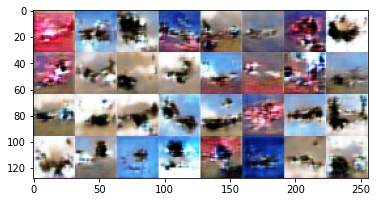

Batch 2201,   D loss: 0.5814 D acc: 0.6406 G loss: 0.9388 G acc: 0.3906:  31%|███▏      | 2200/7000 [04:57<11:14,  7.11it/s]

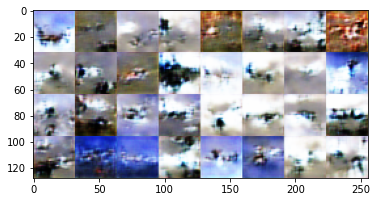

Batch 2301,   D loss: 0.5204 D acc: 0.7344 G loss: 1.0445 G acc: 0.25:  33%|███▎      | 2300/7000 [05:10<10:24,  7.52it/s]  

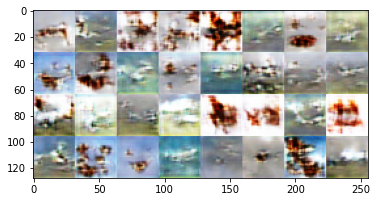

Batch 2401,   D loss: 0.5676 D acc: 0.75 G loss: 1.0442 G acc: 0.2969:  34%|███▍      | 2400/7000 [05:24<10:03,  7.62it/s]  

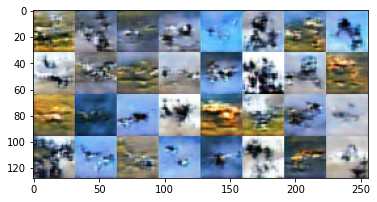

Batch 2501,   D loss: 0.6451 D acc: 0.6094 G loss: 1.0388 G acc: 0.25:  36%|███▌      | 2500/7000 [05:37<10:39,  7.04it/s] 

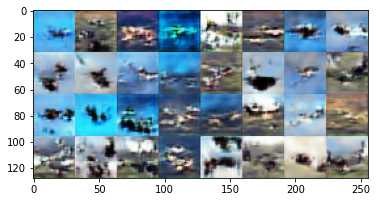

Batch 2601,   D loss: 0.6526 D acc: 0.5781 G loss: 0.999 G acc: 0.25:  37%|███▋      | 2600/7000 [05:50<09:16,  7.91it/s]   

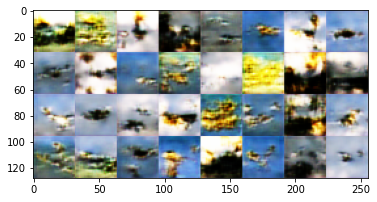

Batch 2701,   D loss: 0.698 D acc: 0.5312 G loss: 0.9685 G acc: 0.2812:  39%|███▊      | 2700/7000 [06:04<08:34,  8.36it/s]

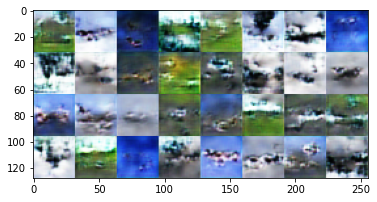

Batch 2801,   D loss: 0.7129 D acc: 0.5625 G loss: 1.0422 G acc: 0.2812:  40%|████      | 2800/7000 [06:17<08:34,  8.17it/s]

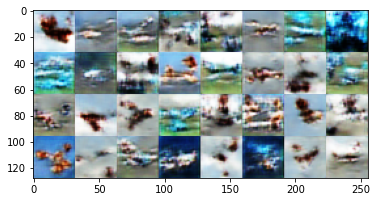

Batch 2901,   D loss: 0.6133 D acc: 0.625 G loss: 0.8494 G acc: 0.375:  41%|████▏     | 2900/7000 [06:31<08:03,  8.48it/s]

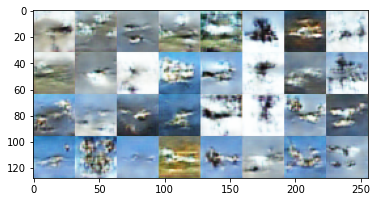

Batch 3001,   D loss: 0.7247 D acc: 0.6094 G loss: 0.8992 G acc: 0.3438:  43%|████▎     | 3000/7000 [06:44<08:50,  7.55it/s]

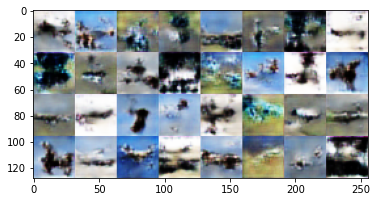

Batch 3101,   D loss: 0.8256 D acc: 0.375 G loss: 0.79 G acc: 0.4844:  44%|████▍     | 3100/7000 [06:57<07:42,  8.44it/s]   

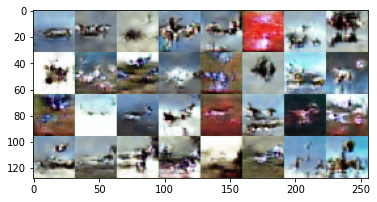

Batch 3201,   D loss: 0.7624 D acc: 0.5156 G loss: 0.912 G acc: 0.3594:  46%|████▌     | 3200/7000 [07:10<08:30,  7.44it/s] 

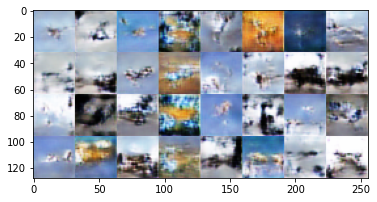

Batch 3301,   D loss: 0.6428 D acc: 0.6406 G loss: 1.1569 G acc: 0.1875:  47%|████▋     | 3300/7000 [07:24<07:44,  7.96it/s]

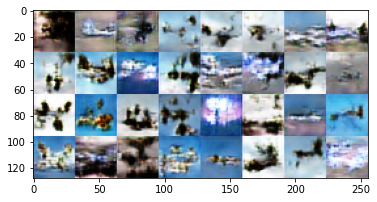

Batch 3401,   D loss: 0.6938 D acc: 0.5938 G loss: 1.1203 G acc: 0.1875:  49%|████▊     | 3400/7000 [07:37<08:24,  7.14it/s]

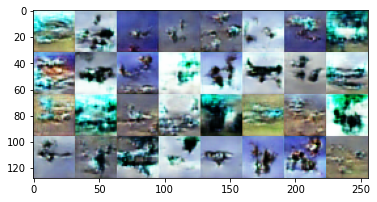

Batch 3501,   D loss: 0.7369 D acc: 0.5625 G loss: 0.9412 G acc: 0.25:  50%|█████     | 3500/7000 [07:51<08:00,  7.28it/s]  

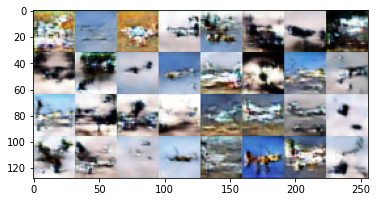

Batch 3601,   D loss: 0.8311 D acc: 0.4688 G loss: 1.0269 G acc: 0.2031:  51%|█████▏    | 3600/7000 [08:04<07:07,  7.96it/s]

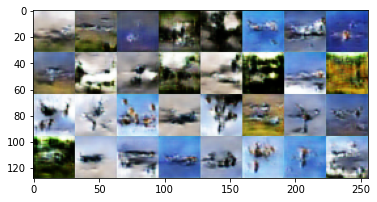

Batch 3701,   D loss: 0.524 D acc: 0.8281 G loss: 0.8997 G acc: 0.3125:  53%|█████▎    | 3700/7000 [08:18<08:06,  6.78it/s] 

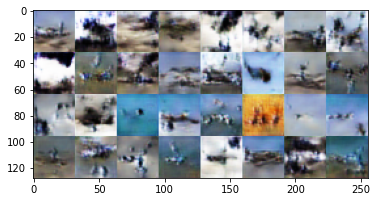

Batch 3801,   D loss: 0.8069 D acc: 0.4531 G loss: 1.0161 G acc: 0.2812:  54%|█████▍    | 3800/7000 [08:32<06:39,  8.02it/s]

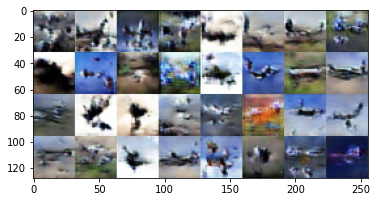

Batch 3901,   D loss: 0.4624 D acc: 0.8438 G loss: 0.9859 G acc: 0.2656:  56%|█████▌    | 3900/7000 [08:46<06:29,  7.97it/s]

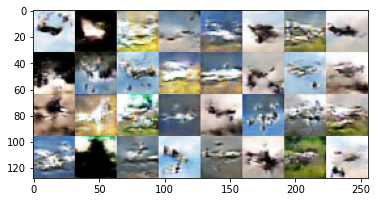

Batch 4001,   D loss: 0.6799 D acc: 0.5625 G loss: 0.8992 G acc: 0.3281:  57%|█████▋    | 4000/7000 [08:59<06:44,  7.41it/s]

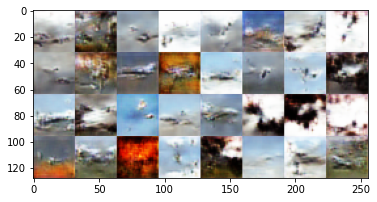

Batch 4101,   D loss: 0.8662 D acc: 0.4219 G loss: 0.9794 G acc: 0.2344:  59%|█████▊    | 4100/7000 [09:13<06:34,  7.36it/s]

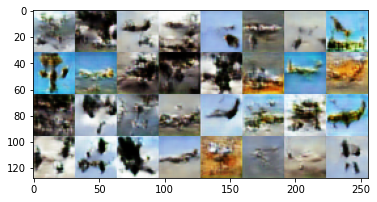

Batch 4201,   D loss: 0.6052 D acc: 0.6094 G loss: 0.8429 G acc: 0.4375:  60%|██████    | 4200/7000 [09:27<05:46,  8.08it/s]

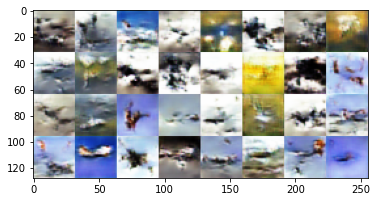

Batch 4301,   D loss: 0.5838 D acc: 0.7031 G loss: 0.6602 G acc: 0.5625:  61%|██████▏   | 4300/7000 [09:41<05:54,  7.62it/s]

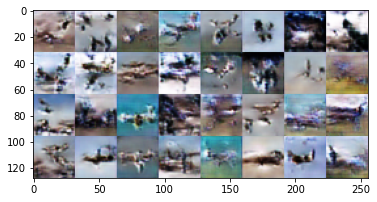

Batch 4401,   D loss: 0.6278 D acc: 0.625 G loss: 0.8534 G acc: 0.3594:  63%|██████▎   | 4400/7000 [09:55<06:37,  6.54it/s] 

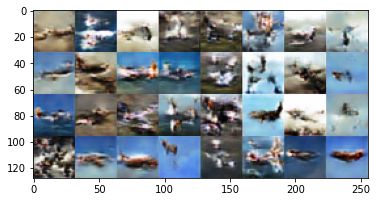

Batch 4501,   D loss: 0.7214 D acc: 0.5312 G loss: 0.8966 G acc: 0.375:  64%|██████▍   | 4500/7000 [10:08<05:54,  7.05it/s] 

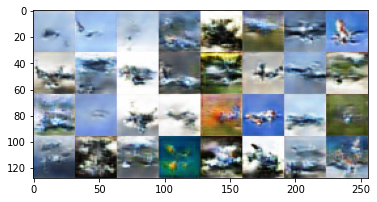

Batch 4601,   D loss: 0.6636 D acc: 0.625 G loss: 0.8523 G acc: 0.3125:  66%|██████▌   | 4600/7000 [10:22<05:00,  7.99it/s] 

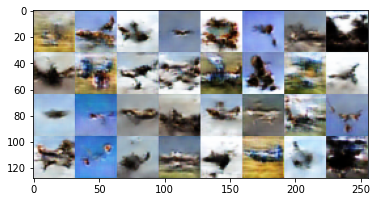

Batch 4701,   D loss: 0.8857 D acc: 0.2969 G loss: 0.9393 G acc: 0.2656:  67%|██████▋   | 4700/7000 [10:36<04:25,  8.66it/s]

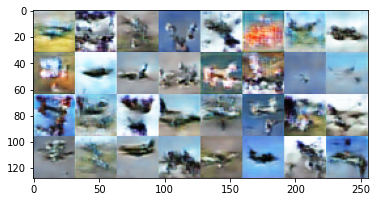

Batch 4801,   D loss: 0.7417 D acc: 0.4844 G loss: 0.7561 G acc: 0.5:  69%|██████▊   | 4800/7000 [10:49<05:08,  7.13it/s]   

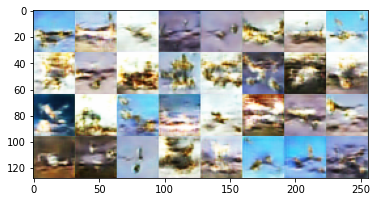

Batch 4901,   D loss: 0.6068 D acc: 0.6406 G loss: 0.8854 G acc: 0.375:  70%|███████   | 4900/7000 [11:03<05:15,  6.66it/s]

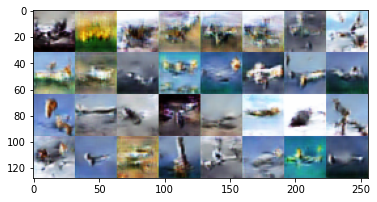

Batch 5001,   D loss: 0.8012 D acc: 0.4531 G loss: 1.1318 G acc: 0.2031:  71%|███████▏  | 5000/7000 [11:17<04:56,  6.75it/s]

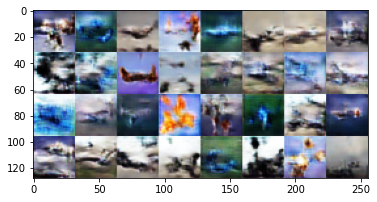

Batch 5101,   D loss: 0.5262 D acc: 0.7656 G loss: 0.7879 G acc: 0.4375:  73%|███████▎  | 5100/7000 [11:31<04:09,  7.61it/s]

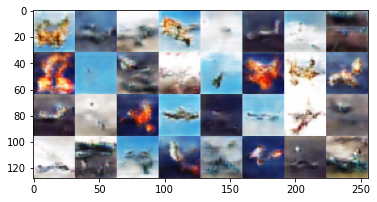

Batch 5201,   D loss: 0.5564 D acc: 0.8125 G loss: 0.8133 G acc: 0.4531:  74%|███████▍  | 5200/7000 [11:45<04:05,  7.33it/s]

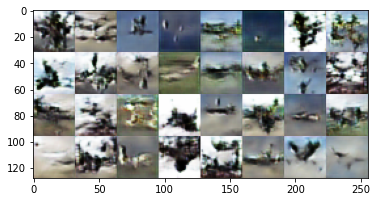

Batch 5301,   D loss: 0.6195 D acc: 0.6094 G loss: 1.0313 G acc: 0.2188:  76%|███████▌  | 5300/7000 [11:59<04:05,  6.94it/s]

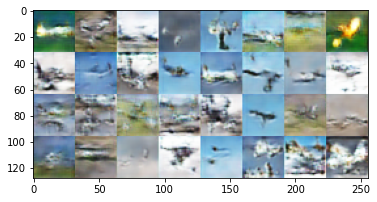

Batch 5401,   D loss: 0.6483 D acc: 0.625 G loss: 0.9262 G acc: 0.2969:  77%|███████▋  | 5400/7000 [12:12<03:25,  7.80it/s] 

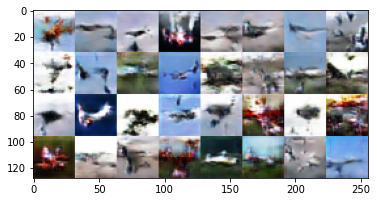

Batch 5501,   D loss: 0.7334 D acc: 0.5469 G loss: 0.6933 G acc: 0.5781:  79%|███████▊  | 5500/7000 [12:26<03:47,  6.59it/s]

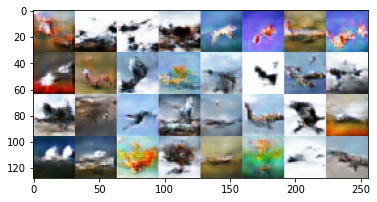

Batch 5601,   D loss: 0.6157 D acc: 0.6562 G loss: 0.819 G acc: 0.4375:  80%|████████  | 5600/7000 [12:40<03:03,  7.61it/s]

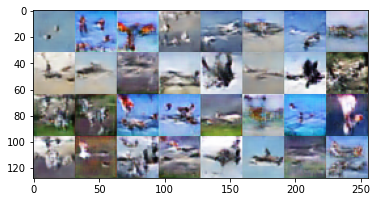

Batch 5701,   D loss: 0.5936 D acc: 0.7031 G loss: 1.0396 G acc: 0.2812:  81%|████████▏ | 5700/7000 [12:53<02:37,  8.24it/s]

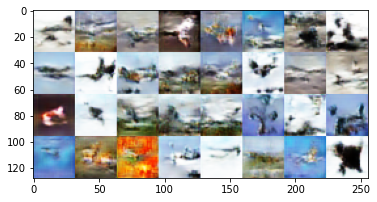

Batch 5801,   D loss: 0.8629 D acc: 0.3906 G loss: 0.9424 G acc: 0.2969:  83%|████████▎ | 5800/7000 [13:06<02:37,  7.60it/s]

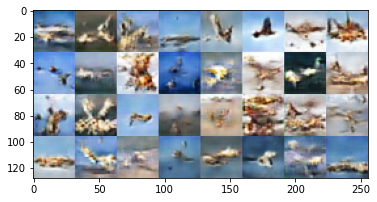

Batch 5901,   D loss: 0.9031 D acc: 0.2969 G loss: 0.9325 G acc: 0.2656:  84%|████████▍ | 5900/7000 [13:20<02:52,  6.39it/s]

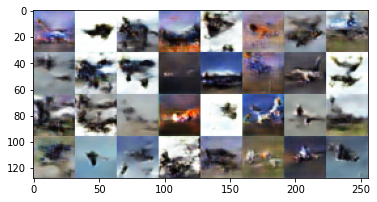

Batch 6001,   D loss: 0.621 D acc: 0.6562 G loss: 0.9448 G acc: 0.25:  86%|████████▌ | 6000/7000 [13:33<02:02,  8.18it/s]   

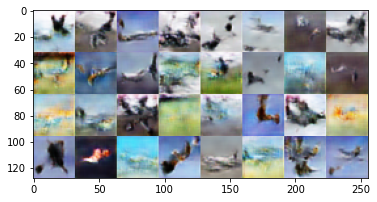

Batch 6101,   D loss: 0.8808 D acc: 0.4219 G loss: 1.0756 G acc: 0.1719:  87%|████████▋ | 6100/7000 [13:47<02:02,  7.34it/s]

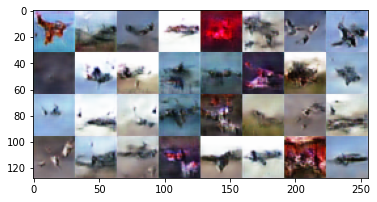

Batch 6201,   D loss: 1.0138 D acc: 0.25 G loss: 0.6536 G acc: 0.6875:  89%|████████▊ | 6200/7000 [14:00<01:59,  6.67it/s]

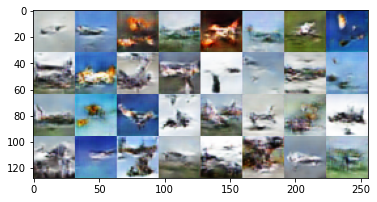

Batch 6301,   D loss: 0.692 D acc: 0.5469 G loss: 0.8221 G acc: 0.4219:  90%|█████████ | 6300/7000 [14:14<01:17,  8.99it/s] 

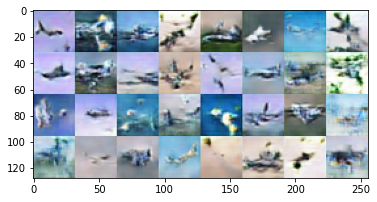

Batch 6401,   D loss: 0.6782 D acc: 0.5625 G loss: 0.8189 G acc: 0.4375:  91%|█████████▏| 6400/7000 [14:27<01:25,  7.01it/s]

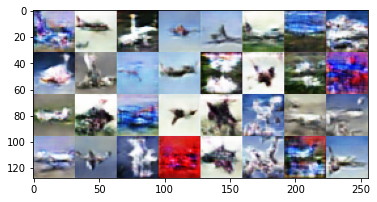

Batch 6501,   D loss: 0.7053 D acc: 0.5938 G loss: 0.8088 G acc: 0.3438:  93%|█████████▎| 6500/7000 [14:40<01:11,  6.99it/s]

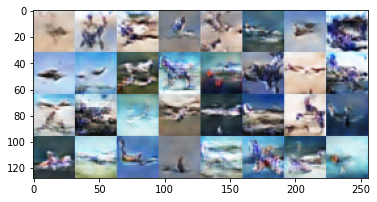

Batch 6601,   D loss: 0.6496 D acc: 0.5938 G loss: 0.8666 G acc: 0.3438:  94%|█████████▍| 6600/7000 [14:53<00:48,  8.17it/s]

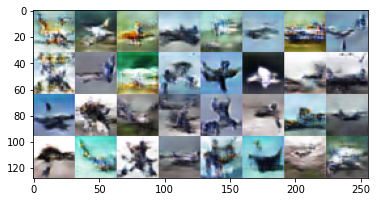

Batch 6701,   D loss: 0.6828 D acc: 0.6406 G loss: 0.7983 G acc: 0.4062:  96%|█████████▌| 6700/7000 [15:07<00:46,  6.44it/s]

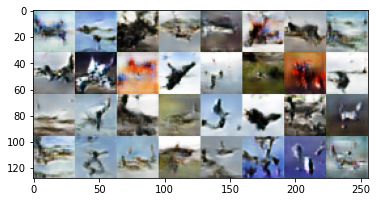

Batch 6801,   D loss: 0.5912 D acc: 0.6406 G loss: 1.0295 G acc: 0.2188:  97%|█████████▋| 6800/7000 [15:21<00:31,  6.38it/s]

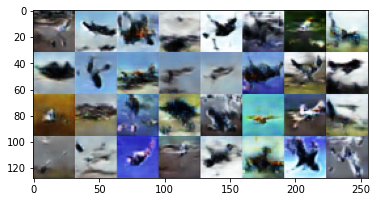

Batch 6901,   D loss: 0.7898 D acc: 0.4531 G loss: 0.8364 G acc: 0.375:  99%|█████████▊| 6900/7000 [15:34<00:13,  7.28it/s] 

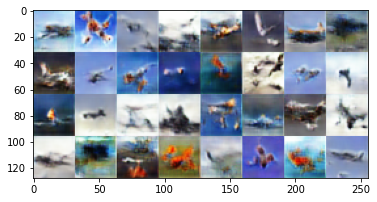

Batch 7000,   D loss: 0.6542 D acc: 0.625 G loss: 0.8935 G acc: 0.25: 100%|██████████| 7000/7000 [15:47<00:00,  7.39it/s]


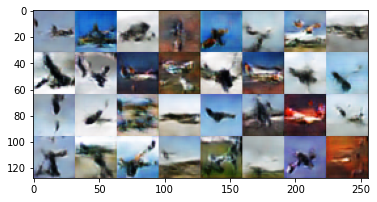

In [8]:
gan = cifar10_dcgan()
gan.train_random_batches(X_train, batches = 7000, batch_size=32, plot_interval = 100)
vis.show_gan_image_predictions(gan, 32)

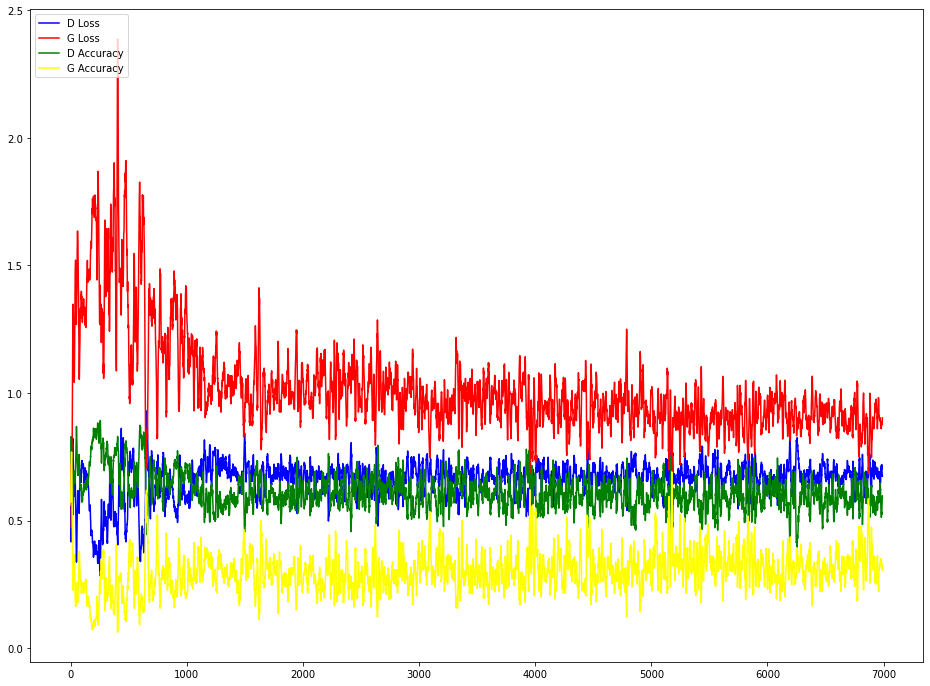

In [9]:
# Plot the final loss curves
def moving_average(a, n=10) :
    s = np.cumsum(a, dtype=float)
    s[n:] = s[n:] - s[:-n]
    return s[n - 1:] / n


plt.figure(figsize=(16, 12))
plt.plot(moving_average(gan.d_losses), c="blue", label="D Loss")
plt.plot(moving_average(gan.g_losses), c="red", label="G Loss")
plt.plot(moving_average(gan.d_accs), c="green", label="D Accuracy")
plt.plot(moving_average(gan.g_accs), c="yellow", label="G Accuracy")
plt.legend(loc="upper left")
plt.show()

## Stability in GANs
Sadly, training a GAN is not always easy. <br/>
Stability during training is important for both discriminator and generator to learn. <br/>
Below is a short video (50s) showing the intermediate results of a GAN being trained on mnist. The final result is a phenomenon known as 'mode collapse'. <br/>
<img src='https://i.imgur.com/lG35xDP.gif'>


## Optional: High Quality Image Generation with StyleGAN

The DCGAN model was an important point in the history of generative adversarial networks. However, these models have difficulty with high resolution images and have long been passed by the current state of the art. </br>
State of the art models for high resolution image generation, such as BigGAN and StyleGAN, can generate new images with high fidelity of e.g. 1024x1024 image data sets. The trade-off is that these models can require weeks to train even with the best GPUs and/or TPUs available. </br>
</br>
**Few-shot learning** A special setting for training generative models is low-shot/few-shot learning where one attempts to create a model that generalizes well on as few samples as possible. This setting allows the power of the state of the art models to be demonstrated while still being able to be trained in a reasonable time. </br>

**StyleGAN few-shot**
The following script allows you to train a StyleGAN with differentiable augmentations on your own data. Few-shot models work best with uniform, clean data where the object takes up the majority of the image.</br>
To the left of Google Colab, click the folder icon on the sidebar, create a new folder in the file explorer and upload your images into it. It's recommended to have at least 100 images. Next, replace the placeholder in the command below with the link to your uploaded folder (e.g. /content/mydata) and execute the command. It's recommended to try out different types of data to see what works and what doesn't.</br>
Alternatively, replace the placeholder by the name of one of the pre-existing data sets (e.g. --dataset='100-shot-obama'):

*   100-shot-obama
*   100-shot-grumpy_cat
*   100-shot-panda
*   100-shot-bridge_of_sighs
*   100-shot-temple_of_heaven
*   100-shot-wuzhen

The script will output intermediate images while training. More full quality samples can be found in the /content/stylegan-lowshot/results folder. Take note that it can take multiple hours before reasonable images start to be generated even when working with these very small data sets.
Before running the script below, restart the runtime and rerun the first cell.






In [ ]:
%cd /content/stylegan-lowshot
%run run_low_shot.py --dataset=/content/mydata --num-gpus=1 --resolution=128 --show-samples-every=1